<a href="https://colab.research.google.com/github/Obreintelly/House_Pricing_Analysis/blob/main/Real_Estate_Pricing_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Data Report:** https://docs.google.com/document/d/17hRju7qoUKrU1KxeSuAJnp51YtRuXH2i/edit

# **2. Importing Relevant Libraries**

In [1]:
#Importing Pandas library
import pandas as pd

#Importing Numpy Library
import numpy as np

#Importing Matplotlib Library

import matplotlib.pyplot as plt

#Importing Seaborn Library

import seaborn as sns

sns.set_theme()

#sns.set_palette('bright')


#Importing Scipy
import scipy
#Importing SKLearn
import sklearn

In [2]:
#Installing Geo Pandas
!pip install geopandas

     |████████████████████████████████| 1.0MB 5.7MB/s 
     |████████████████████████████████| 15.3MB 283kB/s 
     |████████████████████████████████| 6.5MB 44.3MB/s 


In [3]:
#importing geography libraries

import geopandas as gpd

from shapely.geometry import Point, Polygon

# **3. Loading Our Dataset**

In [4]:
#Loading Our Dataset
df= pd.read_csv('/content/Independent Project Week 7 - house_data.csv')

# **4. Previewing Our Dataset**

In [5]:
#Displaying our first 5 rows
df.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [6]:
#Displaying the last 5 rows
df.tail()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
21608,263000018,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287
21612,1523300157,325000.0,2,0.75,1020,1076,2.0,0,0,3,7,1020,0,2008,0,98144,47.5941,-122.299,1020,1357


In [7]:
#Ensuring Our Columns have the correct datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   price          21613 non-null  float64
 2   bedrooms       21613 non-null  int64  
 3   bathrooms      21613 non-null  float64
 4   sqft_living    21613 non-null  int64  
 5   sqft_lot       21613 non-null  int64  
 6   floors         21613 non-null  float64
 7   waterfront     21613 non-null  int64  
 8   view           21613 non-null  int64  
 9   condition      21613 non-null  int64  
 10  grade          21613 non-null  int64  
 11  sqft_above     21613 non-null  int64  
 12  sqft_basement  21613 non-null  int64  
 13  yr_built       21613 non-null  int64  
 14  yr_renovated   21613 non-null  int64  
 15  zipcode        21613 non-null  int64  
 16  lat            21613 non-null  float64
 17  long           21613 non-null  float64
 18  sqft_l

In [8]:
#Dataset Glossary
#Id 
#price  - Price of the house
#bedrooms - Number of Bedrooms
#bathrooms - Number of Bathrooms
#sqft_living - Square feet area of living area
#sqft_lot  - Square feet area of parking Layout
#floors - Number of Floors
#waterfront - Whether waterfront is there or not
#view - Number of Views
#grade - Grades
#sqft_above
#sqft_basement - Square feet area off basement
#yr_built - Year the house is built
#yr_renovated - Year the house is renovated
#zipcode - zipcode os the house
#lat : Latitude of the house
#lon : Longitude of the house
#sqft_living15
#sqft_lot15

In [9]:
#Checking the Size of Our Dataset
print('Our Dataset has: {} Rows, {} Columns'.format(*df.shape))


Our Dataset has: 21613 Rows, 20 Columns


In [10]:
#Checking for number of unique values in our dataset
df.nunique()

id               21436
price             3625
bedrooms            13
bathrooms           30
sqft_living       1038
sqft_lot          9782
floors               6
waterfront           2
view                 5
condition            5
grade               12
sqft_above         946
sqft_basement      306
yr_built           116
yr_renovated        70
zipcode             70
lat               5034
long               752
sqft_living15      777
sqft_lot15        8689
dtype: int64

In [11]:
#Checking the bedrooms column
df.bedrooms.unique()

array([ 3,  2,  4,  5,  1,  6,  7,  0,  8,  9, 11, 10, 33])

In [12]:
#checking bathrooms column
df.bathrooms.unique()

array([1.  , 2.25, 3.  , 2.  , 4.5 , 1.5 , 2.5 , 1.75, 2.75, 3.25, 4.  ,
       3.5 , 0.75, 4.75, 5.  , 4.25, 3.75, 0.  , 1.25, 5.25, 6.  , 0.5 ,
       5.5 , 6.75, 5.75, 8.  , 7.5 , 7.75, 6.25, 6.5 ])

In [13]:
#Further checks on Floors to understand how many floors we have
df.floors.unique()

array([1. , 2. , 1.5, 3. , 2.5, 3.5])

In [14]:
#Further Checks on Waterfront to understand what its rows have
#We take it 1 means yes and o means No
df.waterfront.unique()

array([0, 1])

In [15]:
#Checks on Column view to ensure we have expected values
df.view.unique()

array([0, 3, 4, 2, 1])

In [16]:
#Checks to ensure we know what we have in the Condition rows
df.condition.unique()

array([3, 5, 4, 1, 2])

In [17]:
#From the unique values in our dataset, we have established that the following
#are categorical values: Bedrooms, bathrooms, floors, waterfront, view and  condition. 
#The rest are numerical

In [18]:
df.waterfront.unique()

array([0, 1])

In [19]:
df[df['waterfront']==1]

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
49,822039084,1350000.0,3,2.50,2753,65005,1.0,1,2,5,9,2165,588,1953,0,98070,47.4041,-122.451,2680,72513
230,8096000060,655000.0,2,1.75,1450,15798,2.0,1,4,3,7,1230,220,1915,1978,98166,47.4497,-122.375,2030,13193
246,2025069065,2400000.0,4,2.50,3650,8354,1.0,1,4,3,9,1830,1820,2000,0,98074,47.6338,-122.072,3120,18841
264,2123039032,369900.0,1,0.75,760,10079,1.0,1,4,5,5,760,0,1936,0,98070,47.4683,-122.438,1230,14267
300,3225069065,3080000.0,4,5.00,4550,18641,1.0,1,4,3,10,2600,1950,2002,0,98074,47.6053,-122.077,4550,19508
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19984,2025069140,1900000.0,3,2.50,2830,4334,3.0,1,4,3,10,2830,0,2006,0,98074,47.6318,-122.071,2830,38211
20325,518500480,3000000.0,3,3.50,4410,10756,2.0,1,4,3,11,3430,980,2014,0,98056,47.5283,-122.205,3550,5634
20767,8043700105,2300000.0,4,4.00,4360,8175,2.5,1,4,3,10,3940,420,2007,0,98008,47.5724,-122.104,2670,8525
21201,518500460,2230000.0,3,3.50,3760,5634,2.0,1,4,3,11,2830,930,2014,0,98056,47.5285,-122.205,3560,5762


# **5. Data Cleaning**

In this section, before embarking on data analysis, we will first ensure that our data complies with the following Data Science Principles:

1. Validity
2. Accuracy
3. Consistency
4. Completeness
5. Uniformity


# Validity/Accuracy

In [20]:
#Exploring our columns
df.bedrooms.unique()

array([ 3,  2,  4,  5,  1,  6,  7,  0,  8,  9, 11, 10, 33])

In [21]:
#Checking Out Houses without bedrooms
df[df['bedrooms']==0]

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
875,6306400140,1100000.0,0,0.00,3064,4764,3.5,0,2,3,7,3064,0,1990,0,98102,47.6362,-122.322,2360,4000
3119,3918400017,380000.0,0,0.00,1470,979,3.0,0,2,3,8,1470,0,2006,0,98133,47.7145,-122.356,1470,1399
3467,1453602309,288000.0,0,1.50,1430,1650,3.0,0,0,3,7,1430,0,1999,0,98125,47.7222,-122.290,1430,1650
4868,6896300380,228000.0,0,1.00,390,5900,1.0,0,0,2,4,390,0,1953,0,98118,47.5260,-122.261,2170,6000
6994,2954400190,1300000.0,0,0.00,4810,28008,2.0,0,0,3,12,4810,0,1990,0,98053,47.6642,-122.069,4740,35061
8477,2569500210,339950.0,0,2.50,2290,8319,2.0,0,0,3,8,2290,0,1985,0,98042,47.3473,-122.151,2500,8751
8484,2310060040,240000.0,0,2.50,1810,5669,2.0,0,0,3,7,1810,0,2003,0,98038,47.3493,-122.053,1810,5685
9773,3374500520,355000.0,0,0.00,2460,8049,2.0,0,0,3,8,2460,0,1990,0,98031,47.4095,-122.168,2520,8050
9854,7849202190,235000.0,0,0.00,1470,4800,2.0,0,0,3,7,1470,0,1996,0,98065,47.5265,-121.828,1060,7200
12653,7849202299,320000.0,0,2.50,1490,7111,2.0,0,0,3,7,1490,0,1999,0,98065,47.5261,-121.826,1500,4675


In [22]:
#It is highly unlikely that there will be any houses with no bedrooms being let
#We therefore drop all the Houses with zero bedrooms to ensure we have
#accurate data. The number of rows with this issue suggests that this may 
#be more of an anomaly than design

df = df.drop(df[(df.bedrooms == 0)].index)

In [23]:
df.shape

(21600, 20)

In [24]:
#Checking the Houses with 33 bedrooms
#Highly unlike to have a house with 33 berooms and 2 bedrooms but with just 1 floor
df[df['bedrooms']==33]

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15870,2402100895,640000.0,33,1.75,1620,6000,1.0,0,0,5,7,1040,580,1947,0,98103,47.6878,-122.331,1330,4700


In [25]:
#It is highly unlikely that a house will have 33 bedrooms, 1 floor but just
#1 bedroom. This might have been a data entry error. We thus proceed to 
#drop this entry.
df= df.drop(df[df['bedrooms']==33].index)

In [26]:
#Shape of our data
df.shape

(21599, 20)

In [27]:
#Checking Bathroom column to ensure we have the correct values
df.bathrooms.unique()

array([1.  , 2.25, 3.  , 2.  , 4.5 , 1.5 , 2.5 , 1.75, 2.75, 3.25, 4.  ,
       3.5 , 0.75, 4.75, 5.  , 4.25, 3.75, 1.25, 0.  , 5.25, 6.  , 0.5 ,
       5.5 , 6.75, 5.75, 8.  , 7.5 , 7.75, 6.25, 6.5 ])

In [28]:
#We validate our data with an external source to undertand whether the use of
#fractions for bathrooms is not an anormally. In the US, this is a common
#phenomenon in the real estate where the Utilities in a bathroom are counted. A
#bathroom with just shower and sink will be classified as half a bathroom.
#More can be accessed here: https://www.homelight.com/blog/buyer-what-is-a-half-bath/ 

In [29]:
#Checking building year column
df.yr_built.unique()

array([1955, 1951, 1933, 1965, 1987, 2001, 1995, 1963, 1960, 2003, 1942,
       1927, 1977, 1900, 1979, 1994, 1916, 1921, 1969, 1947, 1968, 1985,
       1941, 1915, 1909, 1948, 2005, 1929, 1981, 1930, 1904, 1996, 2000,
       1984, 2014, 1922, 1959, 1966, 1953, 1950, 2008, 1991, 1954, 1973,
       1925, 1989, 1972, 1986, 1956, 2002, 1992, 1964, 1952, 1961, 2006,
       1988, 1962, 1939, 1946, 1967, 1975, 1980, 1910, 1983, 1978, 1905,
       1971, 2010, 1945, 1924, 1990, 1914, 1926, 2004, 1923, 2007, 1976,
       1949, 1999, 1901, 1993, 1920, 1997, 1943, 1957, 1940, 1918, 1928,
       1974, 1911, 1936, 1937, 1982, 1908, 1931, 1998, 1913, 2013, 1907,
       1958, 2012, 1912, 2011, 1917, 1932, 1944, 1902, 2009, 1903, 1970,
       2015, 1934, 1938, 1919, 1906, 1935])

In [30]:
#Our building data is from the year 1900 to 2015

In [31]:
#Checking year on renovation
df.yr_renovated.unique()

array([   0, 1991, 2002, 2010, 1999, 1992, 2013, 1994, 1978, 2005, 2008,
       2003, 1984, 1954, 2014, 2011, 1974, 1983, 1945, 1990, 1988, 1957,
       1977, 1981, 1995, 2000, 1998, 1970, 1989, 2004, 1986, 2009, 2007,
       1987, 1973, 2006, 1985, 2001, 1980, 1971, 1979, 1997, 1950, 1969,
       1948, 2015, 1968, 2012, 1963, 1951, 1993, 1962, 1996, 1972, 1953,
       1955, 1982, 1956, 1940, 1976, 1946, 1975, 1958, 1964, 1959, 1960,
       1967, 1965, 1934, 1944])

In [32]:
#Year 0 will need further investigations

df[df['yr_renovated']==0]

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
5,7237550310,1230000.0,4,4.50,5420,101930,1.0,0,0,3,11,3890,1530,2001,0,98053,47.6561,-122.005,4760,101930
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287


In [33]:
#Zero must mean the house was never renovated

# Completeness

In [34]:
#Checking for any missing values

df.isna().any().sum()

0

# Consistency

In [35]:
#Checking for Duplicates

df.duplicated().any()

True

In [36]:
#Checking how many duplicates we have
df.duplicated().any().sum()

1

In [37]:
#We drop the duplicated row
df=df.drop_duplicates()

In [38]:
#CHecking to ensure we do not have anymore duplicates
df.duplicated().any()

False

# Dealing with Outliers in Our Dataset

In [39]:

#Checking for Outliers in Our Dataset


In [40]:
#plt.figure(figsize=(15,10))
#for i in range (len(df.columns)):
#  plt.subplot(3,5,i+1)
#  sns.boxplot(df[df.columns[i]]);

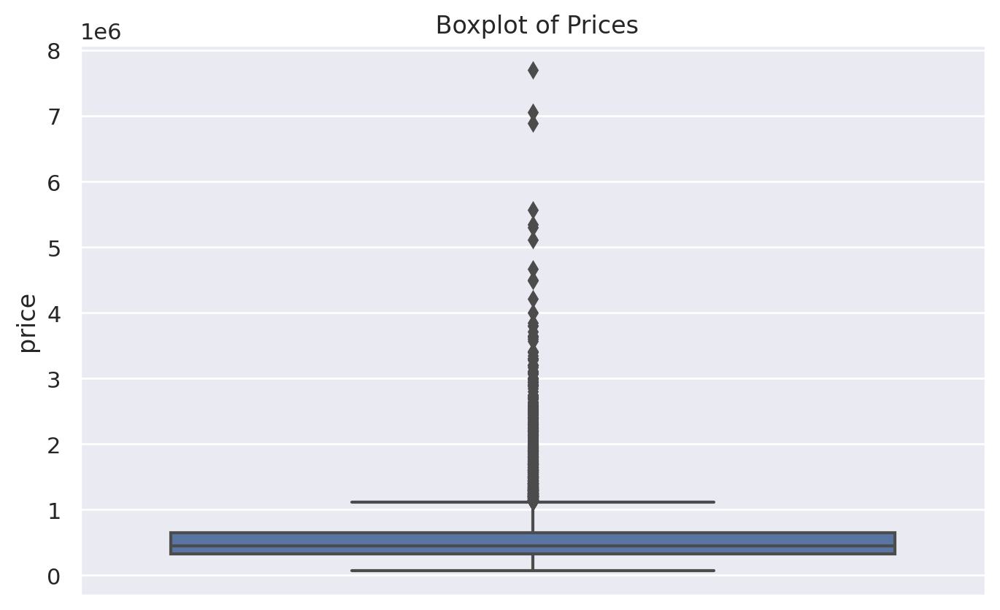

In [41]:
#Checking for Outliers in Our Dataset
plt.figure(figsize=(8, 5), dpi=200)
sns.boxplot(data=df, y='price')
plt.title(' Boxplot of Prices');

In [42]:
#Since the price of a house is determined primarily by its size, i.e the number of
#bedrooms, we shall investigate the relationship between size and outliers in our dataset

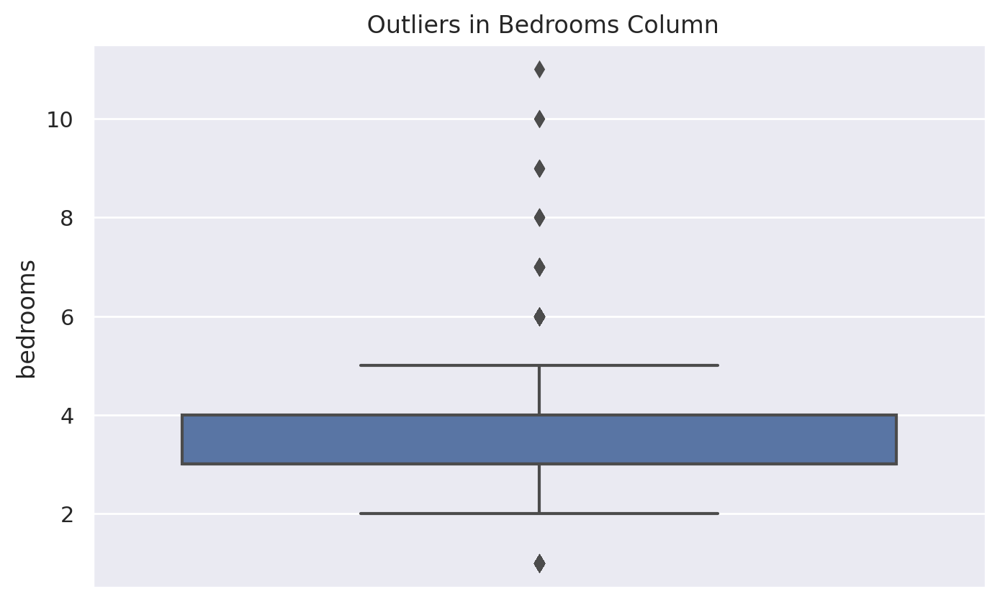

In [43]:
#Checking for Outliers in Our Dataset
plt.figure(figsize=(8, 5), dpi=200)
sns.boxplot(data=df, y='bedrooms')
plt.title(' Outliers in Bedrooms Column');

In [44]:
#Clearly 5 bedrooms and above are outliers in our data. 
#We will investigate all the bedrooms above 5 and determine whether to
#include them in the dataset or not
#We have about 13 eight bedroomed houses
df[df['bedrooms']==8]

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
1660,9126101740,490000.0,8,5.00,2800,2580,2.0,0,0,3,8,1880,920,1997,0,98122,47.6086,-122.303,1800,2580
4035,685000115,2150000.0,8,6.00,4340,9415,2.0,0,0,3,8,4340,0,1967,0,98004,47.6316,-122.202,2050,9100
4067,7226500100,373000.0,8,3.00,2850,12714,1.0,0,0,3,7,2850,0,1959,0,98055,47.4859,-122.205,1480,4942
6174,1873400020,340000.0,8,2.75,2790,6695,1.0,0,0,3,7,1470,1320,1977,0,98133,47.7565,-122.331,1760,7624
9077,6746700615,700000.0,8,2.50,2280,3000,1.5,0,0,3,7,1210,1070,1911,0,98105,47.6675,-122.316,1610,3000
9452,2769600590,900000.0,8,4.00,4020,7500,1.0,0,0,3,8,2010,2010,1968,0,98107,47.6732,-122.363,1560,3737
10958,1652500060,1650000.0,8,2.75,4040,20666,1.0,0,0,4,9,2020,2020,1962,0,98004,47.6340,-122.221,3670,20500
12885,8813400155,808000.0,8,3.75,3460,4600,2.0,0,0,3,7,2860,600,1987,0,98105,47.6617,-122.289,2170,3750
15070,7418000130,430000.0,8,3.25,4300,10441,2.0,0,0,4,8,2800,1500,1979,0,98059,47.4786,-122.131,1780,10457
15670,8141200080,680000.0,8,2.75,2530,4800,2.0,0,0,4,7,1390,1140,1901,0,98112,47.6241,-122.305,1540,4800


In [45]:
#We only have one 11 bedroom house
df[df['bedrooms']==11]

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8757,1773100755,520000.0,11,3.0,3000,4960,2.0,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960


In [46]:
#We have 3 ten bedroom houses
df[df['bedrooms']==10]

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
13314,627300145,1150000.0,10,5.25,4590,10920,1.0,0,2,3,9,2500,2090,2008,0,98004,47.5861,-122.113,2730,10400
15161,5566100170,650000.0,10,2.00,3610,11914,2.0,0,0,4,7,3010,600,1958,0,98006,47.5705,-122.175,2040,11914
19254,8812401450,660000.0,10,3.00,2920,3745,2.0,0,0,4,7,1860,1060,1913,0,98105,47.6635,-122.320,1810,3745


In [47]:
#We have about 6 nine bedroom houses
df[df['bedrooms']==9]

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
4096,1997200215,599999.0,9,4.5,3830,6988,2.5,0,0,3,7,2450,1380,1938,0,98103,47.6927,-122.338,1460,6291
4235,2902200015,700000.0,9,3.0,3680,4400,2.0,0,0,3,7,2830,850,1908,0,98102,47.6374,-122.324,1960,2450
6079,9822700190,1280000.0,9,4.5,3650,5000,2.0,0,0,3,8,2530,1120,1915,2010,98105,47.6604,-122.289,2510,5000
8546,424049043,450000.0,9,7.5,4050,6504,2.0,0,0,3,7,4050,0,1996,0,98144,47.5923,-122.301,1448,3866
16844,8823900290,1400000.0,9,4.0,4620,5508,2.5,0,0,3,11,3870,750,1915,0,98105,47.6684,-122.309,2710,4320
18443,8823901445,934000.0,9,3.0,2820,4480,2.0,0,0,3,7,1880,940,1918,0,98105,47.6654,-122.307,2460,4400


In [48]:
#We have around 272 six bedroomed houses
df[df['bedrooms']==6]

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
209,6300000550,464000.0,6,3.00,2300,3404,2.0,0,0,3,7,1600,700,1920,1994,98133,47.7067,-122.343,1560,1312
232,9264902050,315000.0,6,2.75,2940,7350,1.0,0,0,3,8,1780,1160,1978,0,98023,47.3103,-122.339,2120,8236
239,5152100060,472000.0,6,2.50,4410,14034,1.0,0,2,4,9,2350,2060,1965,0,98003,47.3376,-122.324,2600,13988
331,2946001550,279000.0,6,1.75,2240,11180,2.0,0,0,4,7,2240,0,1955,0,98198,47.4200,-122.323,1590,7955
486,9286000240,1070000.0,6,3.50,4860,11793,2.0,0,0,3,11,3860,1000,1998,0,98006,47.5521,-122.137,3600,11793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20984,2149800278,343000.0,6,5.00,2732,7655,2.0,0,0,3,7,2732,0,2009,0,98002,47.3045,-122.211,3078,69993
21085,4449800480,677790.0,6,3.00,2800,4213,2.0,0,0,3,8,2800,0,1998,0,98117,47.6892,-122.389,1440,3960
21186,7896300592,303500.0,6,4.50,3390,7200,2.0,0,0,3,8,2440,950,2007,0,98118,47.5205,-122.288,2040,7214
21375,6061500100,1170000.0,6,3.50,4310,7760,2.0,0,0,3,10,3260,1050,2013,0,98059,47.5297,-122.155,4620,10217


In [49]:
#We have about 50 seven bedroom houses.
df[df['bedrooms']==7]

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
556,5486800070,1950000.0,7,3.50,4640,15235,2.0,0,1,3,11,2860,1780,1965,2003,98040,47.5666,-122.231,3230,20697
1135,4024100951,420000.0,7,3.00,2940,8624,1.0,0,0,3,8,1690,1250,1977,0,98155,47.7555,-122.307,1850,8031
1241,7227802030,350000.0,7,3.00,2800,9569,1.0,0,2,3,7,1400,1400,1963,0,98056,47.5102,-122.183,2150,7333
3721,5451100490,884900.0,7,4.75,5370,10800,1.5,0,0,3,8,5370,0,1967,0,98040,47.5380,-122.223,2310,10910
4024,9175600025,800000.0,7,6.75,7480,41664,2.0,0,2,3,11,5080,2400,1953,0,98166,47.4643,-122.368,2810,33190
4717,2025049006,750000.0,7,2.75,3410,4056,1.5,0,0,4,8,2130,1280,1906,0,98102,47.6454,-122.316,2510,4056
4760,4178300130,950000.0,7,3.50,3470,16264,2.0,0,0,4,9,3470,0,1980,0,98007,47.6203,-122.149,3040,13500
4867,5561300480,600000.0,7,2.25,3170,36384,2.0,0,0,3,8,3170,0,1969,0,98027,47.4654,-122.003,2460,38370
7023,686400380,770000.0,7,2.25,3260,8145,2.0,0,0,5,8,3260,0,1967,0,98008,47.6336,-122.115,2340,8145
7191,7159200005,3200000.0,7,4.50,6210,8856,2.5,0,2,5,11,4760,1450,1910,0,98109,47.6307,-122.354,2940,5400


In [50]:
#We will drop all houses with bedrooms greater than 6 from our dataset

df = df.drop(df[(df.bedrooms > 6)].index)

In [51]:
df.shape

(21535, 20)

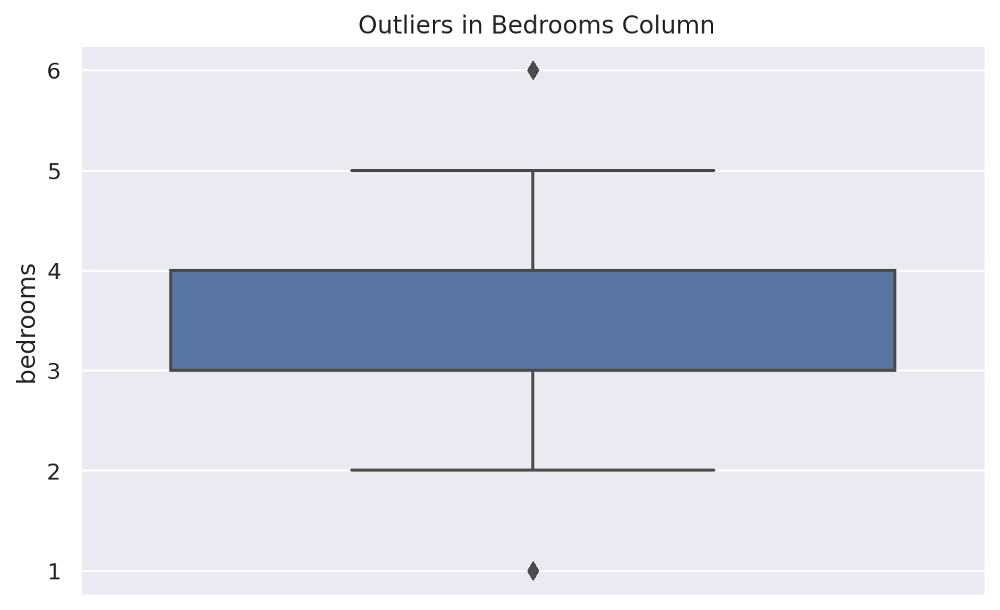

In [52]:
#Checking Our new Dataset
plt.figure(figsize=(8, 5), dpi=200)
sns.boxplot(data=df, y='bedrooms')
plt.title(' Outliers in Bedrooms Column');

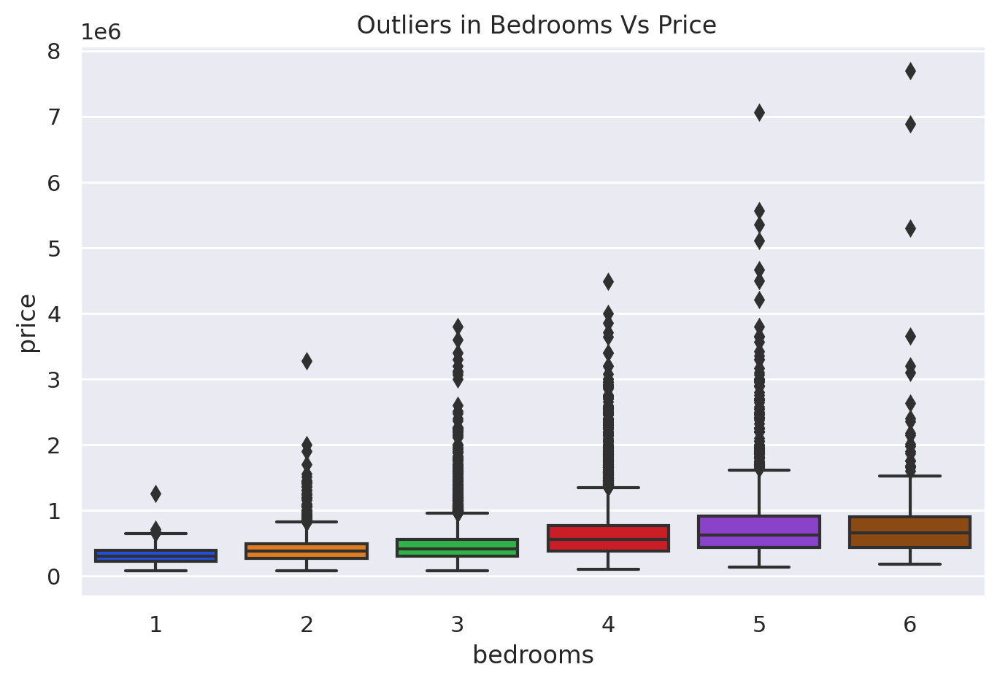

In [53]:
#Checking Our new Dataset
plt.figure(figsize=(8, 5), dpi=200)
sns.boxplot(data=df, y='price', x='bedrooms', palette='bright')
plt.title(' Outliers in Bedrooms Vs Price');

In [54]:
#We still have Outliers in Our Dataset which we can address using
#Z-score approach
#from scipy import stats

#def find_outliers(df, threshold):
    
#    threshold_z_score = stats.norm.ppf(threshold)
    
#    z_score = pd.DataFrame(np.abs(stats.zscore(df)), columns = df.columns)
    
#    return (z_score > threshold_z_score). sum(axis=0)

In [55]:
#stats.norm.ppf(0.5)

In [56]:
#Remove Outliers
#def remove_outliers(df, threshold):
    
 #   threshold_z_score = stats.norm.ppf(threshold)
    
 #   z_score = pd.DataFrame(np.abs(stats.zscore(df)), columns = df.columns)
    
  #  z_score = (z_score > threshold_z_score)
    
    # get the indecies
    
   # outliers =  z_score.sum(axis=1)
    #outliers = outliers > 0
    #outliers_index = df.index[outliers]
    
    
  #df =df.drop(outliers_index, axis =0).reset_index(drop=True)
    
   # return df
    

In [57]:
#find_outliers(df, 0.9999)

In [58]:
#df.shape

In [59]:
#Removing the Outliers
#q1= df.quantile(0.25)
#q3= df.quantile(0.75)
#iqr= q3-q1
#df = df[~((df < (q1 - 1.5 * iqr)) | (df > (q3 + 1.5 * iqr))).any(axis=1)]

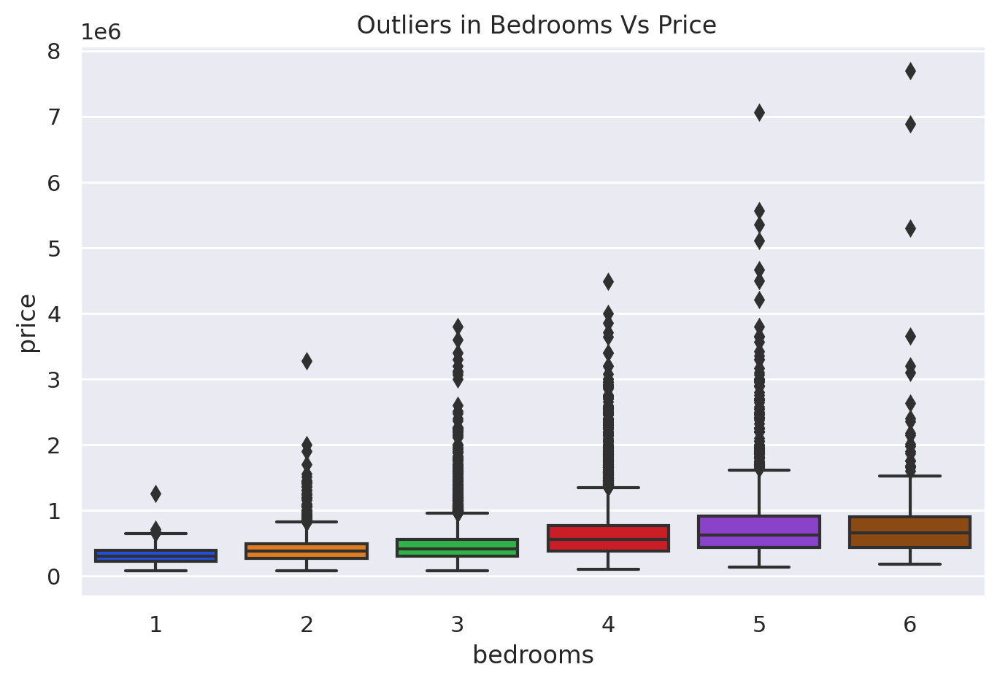

In [60]:
#Checking Our new Dataset
plt.figure(figsize=(8, 5), dpi=200)
sns.boxplot(data=df, y='price', x='bedrooms', palette= 'bright')
plt.title(' Outliers in Bedrooms Vs Price');

In [61]:
#Checking Shape of our Dataset

df.shape

(21535, 20)

In [62]:
#Exploring Our Dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21535 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21535 non-null  int64  
 1   price          21535 non-null  float64
 2   bedrooms       21535 non-null  int64  
 3   bathrooms      21535 non-null  float64
 4   sqft_living    21535 non-null  int64  
 5   sqft_lot       21535 non-null  int64  
 6   floors         21535 non-null  float64
 7   waterfront     21535 non-null  int64  
 8   view           21535 non-null  int64  
 9   condition      21535 non-null  int64  
 10  grade          21535 non-null  int64  
 11  sqft_above     21535 non-null  int64  
 12  sqft_basement  21535 non-null  int64  
 13  yr_built       21535 non-null  int64  
 14  yr_renovated   21535 non-null  int64  
 15  zipcode        21535 non-null  int64  
 16  lat            21535 non-null  float64
 17  long           21535 non-null  float64
 18  sqft_l

In [63]:
#Checking for number of Unique Values in Our Columns
df.nunique()

id               21361
price             3616
bedrooms             6
bathrooms           29
sqft_living       1028
sqft_lot          9759
floors               6
waterfront           2
view                 5
condition            5
grade               11
sqft_above         939
sqft_basement      304
yr_built           116
yr_renovated        70
zipcode             70
lat               5031
long               751
sqft_living15      776
sqft_lot15        8675
dtype: int64

In [64]:
# Previous removal of outliers in our dataset deleted all the No values (0) from 
#Our dataset
#Correcting that gives us all the classfications in the waterfront column for 
#example
df.waterfront.unique()

array([0, 1])

In [65]:
#Clearly removing outliers the way we have done yields the wrong results
#Our categorical data is negatively impact. We shall therefore proceed with only dropping
#Columns with bedrooms greater than 6 and retain all the important classifications
#in our categorical data. 

# Feature Engineering

In [66]:
# From external validation, we have established that our dataset is from Kings County
# available here: https://data.kingcounty.gov/ 
# The following Columns mean the following:
#sqft_above means the Square footage of the house that is above ground level
#sqft_basement means square footage if the interior house that is below ground level
# sqft_living15 and lot15 mean the square footage of interior housing space and the 
#parking lit space for the nearest 15 neighbours
#View is an index from 0-4 on how good the view of the propery was
#Condition is index from 1 to 5 on the apartment's condition with 5 being great
#Grade is an index between 1 and 13 where, 1-3 falls short of building construction
#and design, 7 has an average level of construction and design and 11-13 have
#a high quality level of construction and design

In [67]:
sqft_only = df[['sqft_living', 'sqft_lot', 'sqft_living15', 'sqft_lot15', 'yr_renovated']]

In [68]:
sqft_only.head()

,sqft_living,sqft_lot,sqft_living15,sqft_lot15,yr_renovated
0,1180,5650,1340,5650,0
1,2570,7242,1690,7639,1991
2,770,10000,2720,8062,0
3,1960,5000,1360,5000,0
4,1680,8080,1800,7503,0


In [69]:
#Given that sqft_living and lot15 are not that relevant for this study 
#we make the decision to drop them later before we start building our model

In [70]:
#We will create a new column and store it as geodata

geodata = [Point(xy) for xy in zip(df.long, df.lat)]

df['geodata']= geodata

# Saving Our Clean Dataset

In [71]:
df.to_csv('df.csv', index=False)

# **6. Exploratory Data Analysis (EDA)**

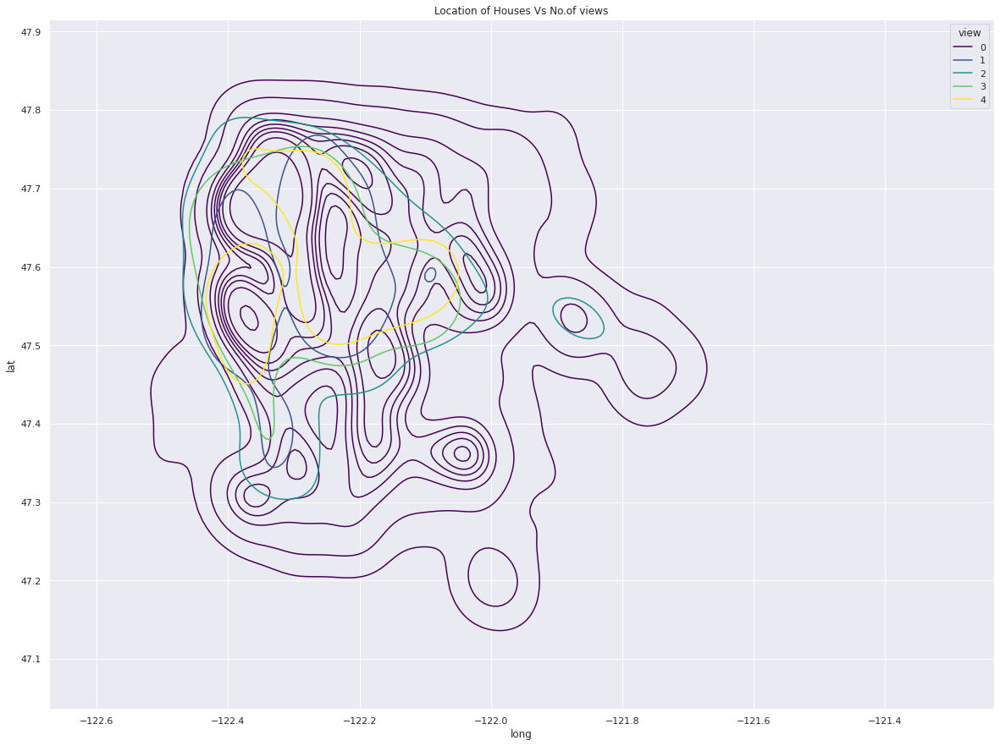

In [72]:
#Geographical Location of Houses and No of views
plt.figure(figsize=(20, 15))
sns.kdeplot(data=df, x='long', y='lat', hue='view', palette='viridis')
plt.title('Location of Houses Vs No.of views');

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  **contour_kws,


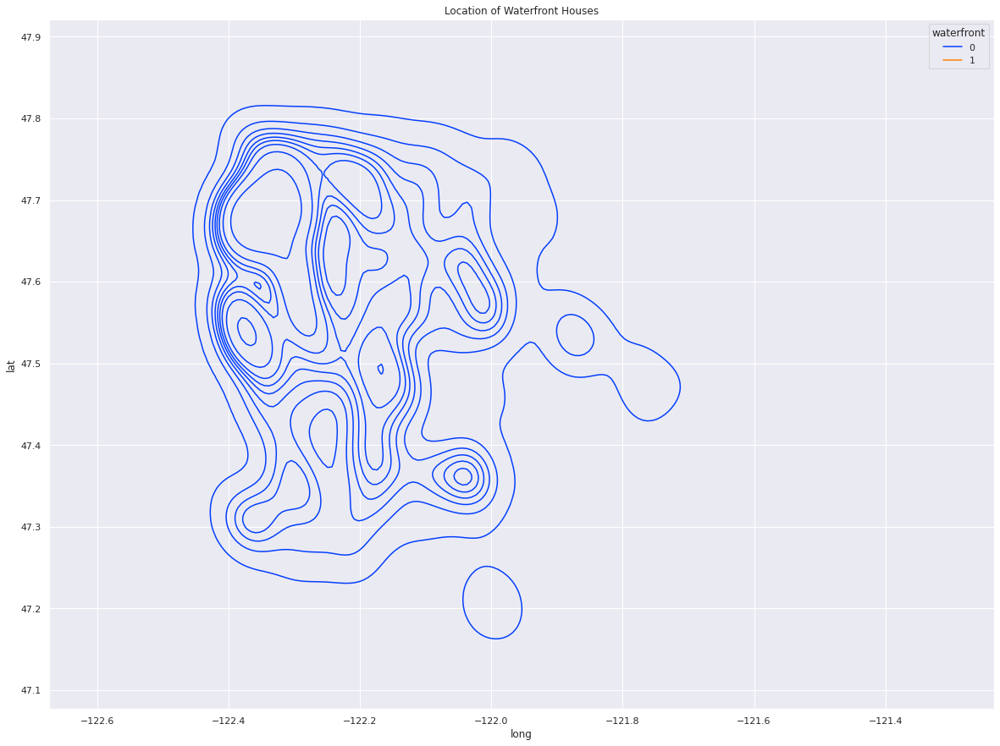

In [73]:
#Geographical Location of Houses and No of views
plt.figure(figsize=(20, 15))
sns.kdeplot(data=df, x='long', y='lat', hue='waterfront', palette='bright')
plt.title('Location of Waterfront Houses');

In [74]:
df[df['waterfront']==1]

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,geodata
49,822039084,1350000.0,3,2.50,2753,65005,1.0,1,2,5,9,2165,588,1953,0,98070,47.4041,-122.451,2680,72513,POINT (-122.451 47.4041)
230,8096000060,655000.0,2,1.75,1450,15798,2.0,1,4,3,7,1230,220,1915,1978,98166,47.4497,-122.375,2030,13193,POINT (-122.375 47.4497)
246,2025069065,2400000.0,4,2.50,3650,8354,1.0,1,4,3,9,1830,1820,2000,0,98074,47.6338,-122.072,3120,18841,POINT (-122.072 47.6338)
264,2123039032,369900.0,1,0.75,760,10079,1.0,1,4,5,5,760,0,1936,0,98070,47.4683,-122.438,1230,14267,POINT (-122.438 47.4683)
300,3225069065,3080000.0,4,5.00,4550,18641,1.0,1,4,3,10,2600,1950,2002,0,98074,47.6053,-122.077,4550,19508,POINT (-122.077 47.6053)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19984,2025069140,1900000.0,3,2.50,2830,4334,3.0,1,4,3,10,2830,0,2006,0,98074,47.6318,-122.071,2830,38211,POINT (-122.071 47.6318)
20325,518500480,3000000.0,3,3.50,4410,10756,2.0,1,4,3,11,3430,980,2014,0,98056,47.5283,-122.205,3550,5634,POINT (-122.205 47.5283)
20767,8043700105,2300000.0,4,4.00,4360,8175,2.5,1,4,3,10,3940,420,2007,0,98008,47.5724,-122.104,2670,8525,POINT (-122.104 47.5724)
21201,518500460,2230000.0,3,3.50,3760,5634,2.0,1,4,3,11,2830,930,2014,0,98056,47.5285,-122.205,3560,5762,POINT (-122.205 47.5285)


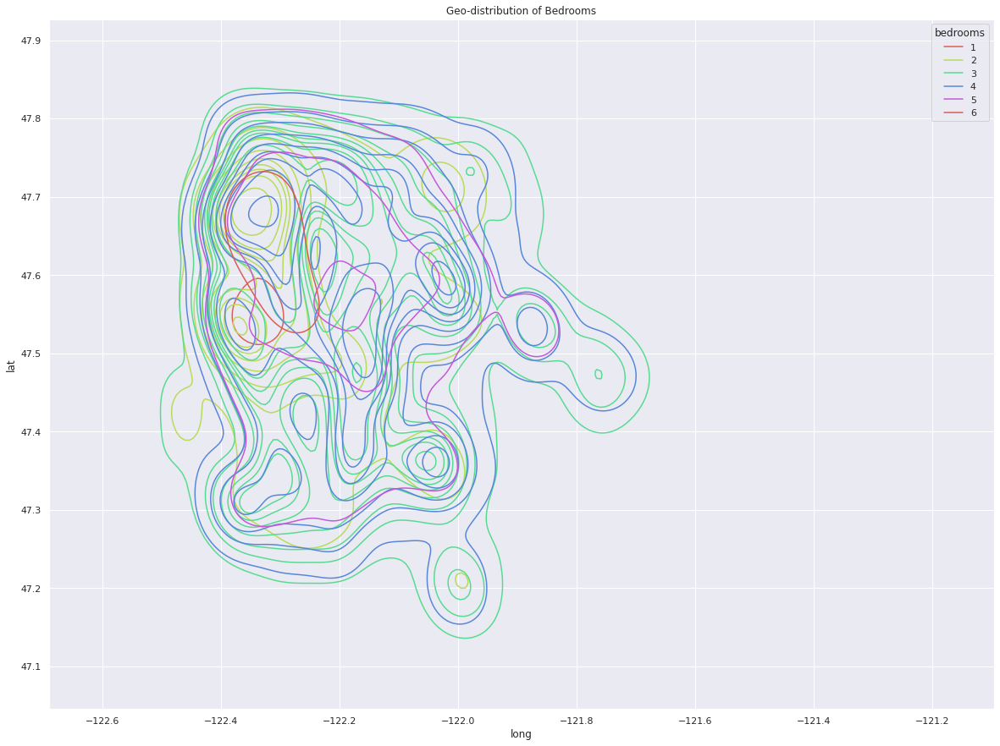

In [75]:
plt.figure(figsize=(20, 15))
sns.kdeplot(data=df, x='long', y='lat', hue='bedrooms', palette='hls')
plt.title('Geo-distribution of Bedrooms');

In [76]:
df.columns

Index(['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'geodata'],
      dtype='object')

In [77]:
df.head(2)

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,geodata
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,POINT (-122.257 47.5112)
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,POINT (-122.319 47.721)


# Univariate Analysis

In [78]:
#Summary Statistics of numerical data in our dataset

df_n = df[['price', 'sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']]

df_n.describe()


,price,sqft_living,sqft_lot,sqft_above,sqft_basement,sqft_living15,sqft_lot15
count,2.153500e+04,21535.000000,2.153500e+04,21535.000000,21535.000000,21535.000000,21535.000000
mean,5.390494e+05,2075.004458,1.510087e+04,1785.042768,289.961690,1985.703320,12762.526910
std,3.652266e+05,909.844065,4.142138e+04,823.344445,439.981071,684.642838,27274.904896
min,7.500000e+04,370.000000,5.200000e+02,370.000000,0.000000,399.000000,651.000000
25%,3.210000e+05,1420.000000,5.040000e+03,1190.000000,0.000000,1490.000000,5100.000000
50%,4.500000e+05,1910.000000,7.616000e+03,1560.000000,0.000000,1840.000000,7620.000000
75%,6.430000e+05,2540.000000,1.067800e+04,2210.000000,560.000000,2360.000000,10083.000000
max,7.700000e+06,12050.000000,1.651359e+06,8860.000000,4820.000000,6210.000000,871200.000000


In [79]:
df_n.price.median()

450000.0

In [80]:
# The most expensive house goes for 7.7 million while the cheapest goes for
#75,000
#The average price for a house is about 54,000 whilst the median house
#price is 45,000

In [81]:
df.bedrooms.value_counts()

3    9822
4    6881
2    2760
5    1601
6     272
1     199
Name: bedrooms, dtype: int64

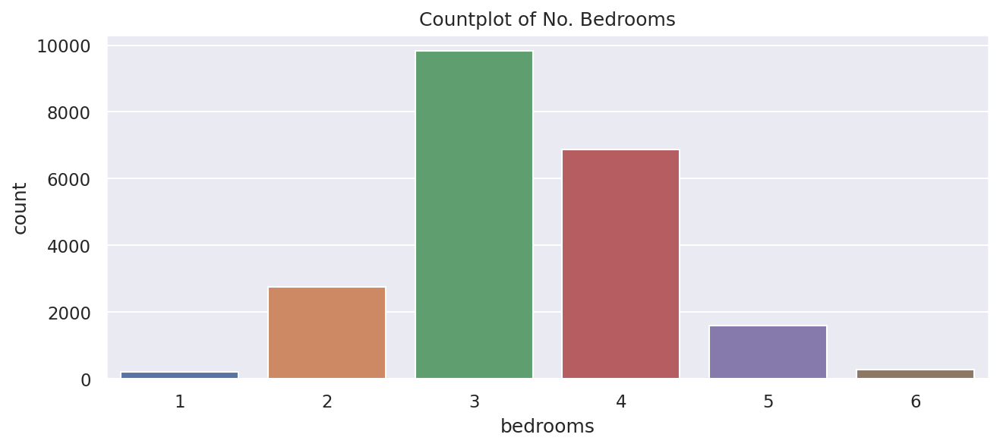

In [82]:
plt.figure(figsize=(10,4), dpi=150)
sns.countplot(data=df, x='bedrooms')
plt.title('Countplot of No. Bedrooms');

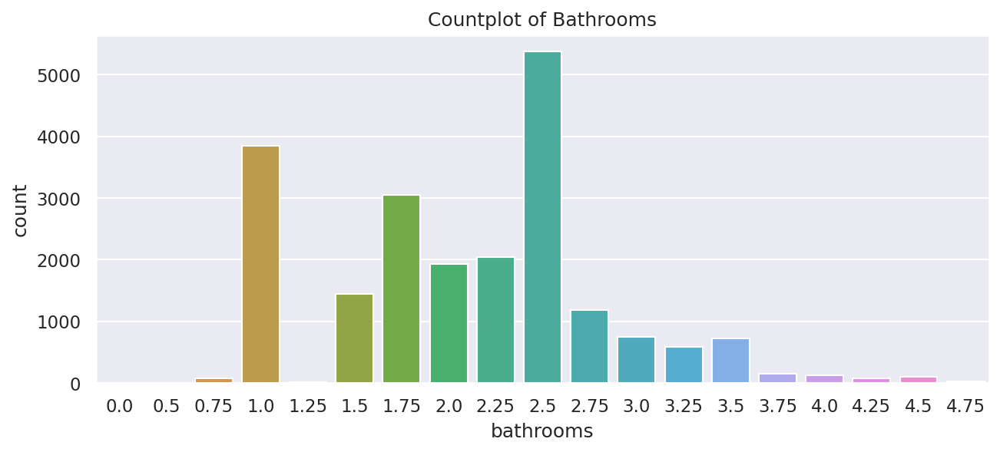

In [83]:
#Countplot of bathrooms with atleast 5 utilities
bat_no_five= df[df['bathrooms']<5]
plt.figure(figsize=(10,4), dpi=150)
sns.countplot(data=bat_no_five, x='bathrooms')
plt.title('Countplot of Bathrooms');

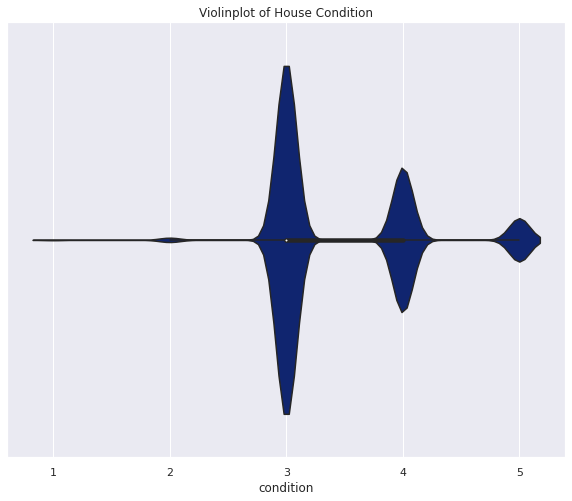

In [84]:
#Violin Plot of the Condition of the Houses
plt.figure(figsize=(10, 8))
sns.violinplot(data=df, x='condition', palette='dark')
plt.title('Violinplot of House Condition');

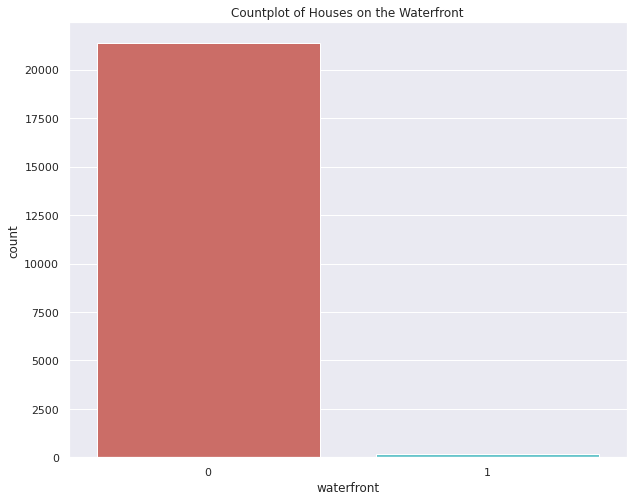

In [85]:
#Countplot of Houses on the Waterfront
plt.figure(figsize=(10, 8))
sns.countplot(data=df, x='waterfront', palette='hls')
plt.title('Countplot of Houses on the Waterfront');


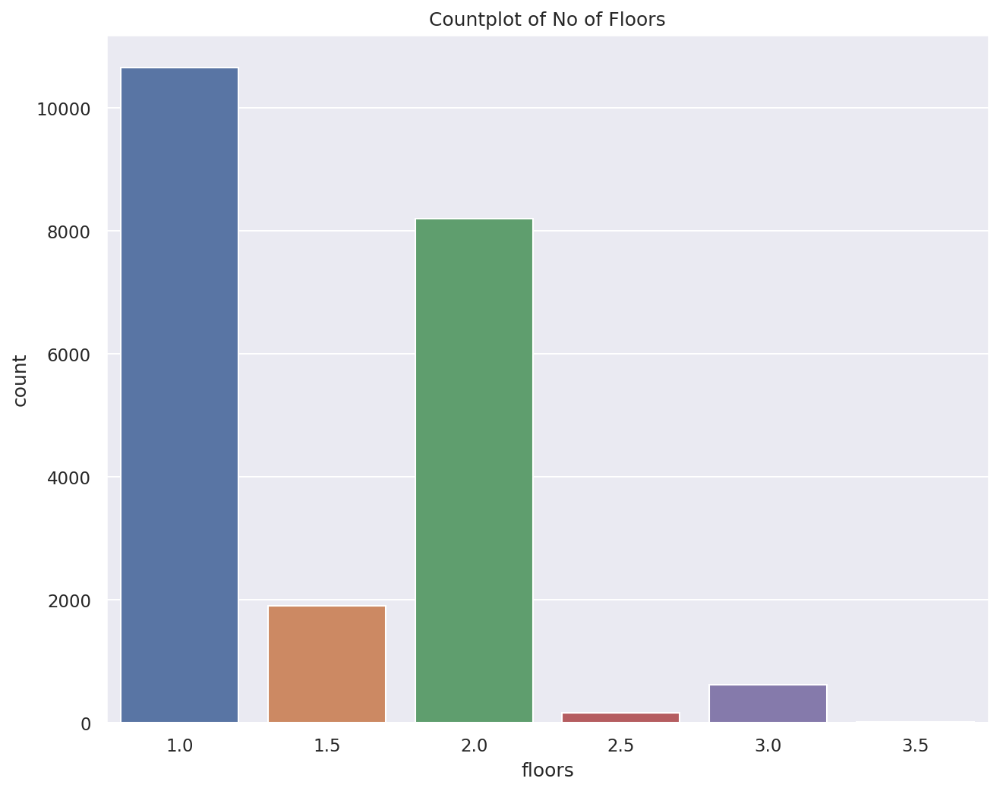

In [86]:
#Plotting Count of Floors
plt.figure(figsize=(10, 8), dpi=150)
sns.countplot(data=df, x='floors')
plt.title('Countplot of No of Floors');

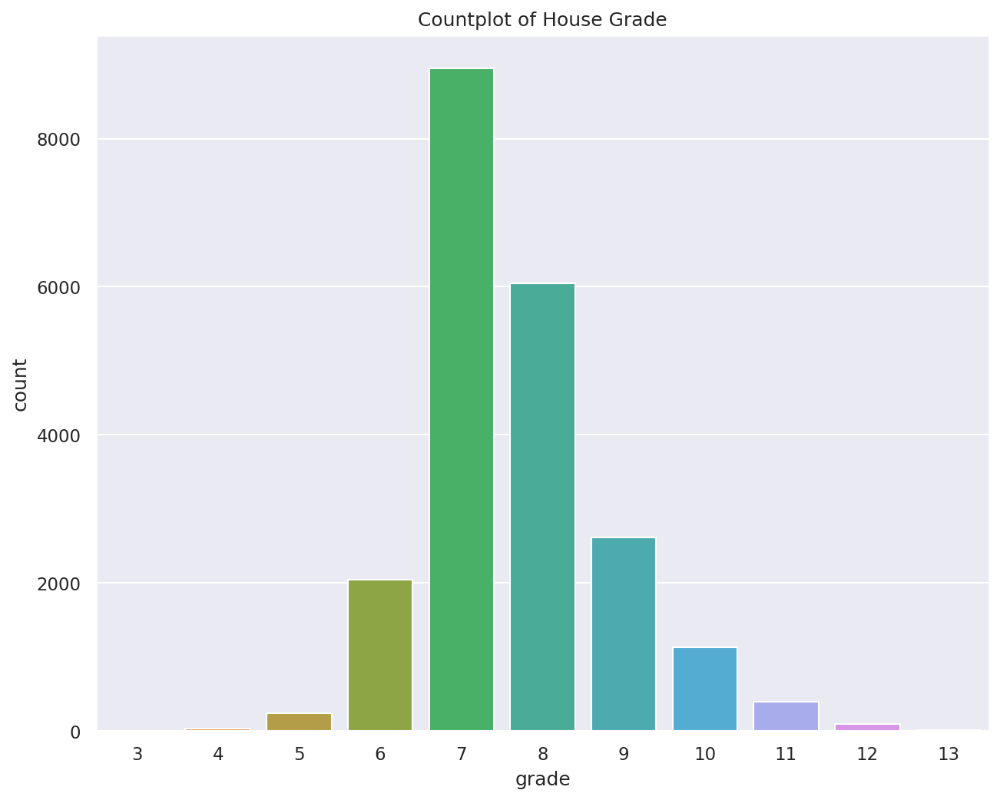

In [87]:
plt.figure(figsize=(10, 8), dpi=150)
sns.countplot(data=df, x='grade')
plt.title('Countplot of House Grade');

In [88]:
#Empirical Cumulative Frequency Distribution plots are a powerful way of exploring
#whether our data follows a normal distribution without succumbing to binning bias
#prevalent in the use of Histograms

# Create a function for computing and plotting the ECDF with default parameters
def plot_ecdf(data,title = "ECDF Plot", xlabel = 'Data Values', ylabel = 'Percentage'):
    
    """ 
    Function to plot ecdf taking a column of data as input.
    """
    xaxis = np.sort(data)
    yaxis = np.arange(1, len(data)+1)/len(data)
    plt.plot(xaxis,yaxis,linestyle='none',marker='.')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.margins(0.02)

In [89]:
# Creating our Empirical Cumulative Frequency Distribution function
def ecdf(data):
    """ 
    This function creates the x and y axis for an ecdf
    plot given the data as input.
    """
    xaxis = np.sort(data)
    yaxis = np.arange(1,len(data)+1)/len(data)
    return xaxis, yaxis

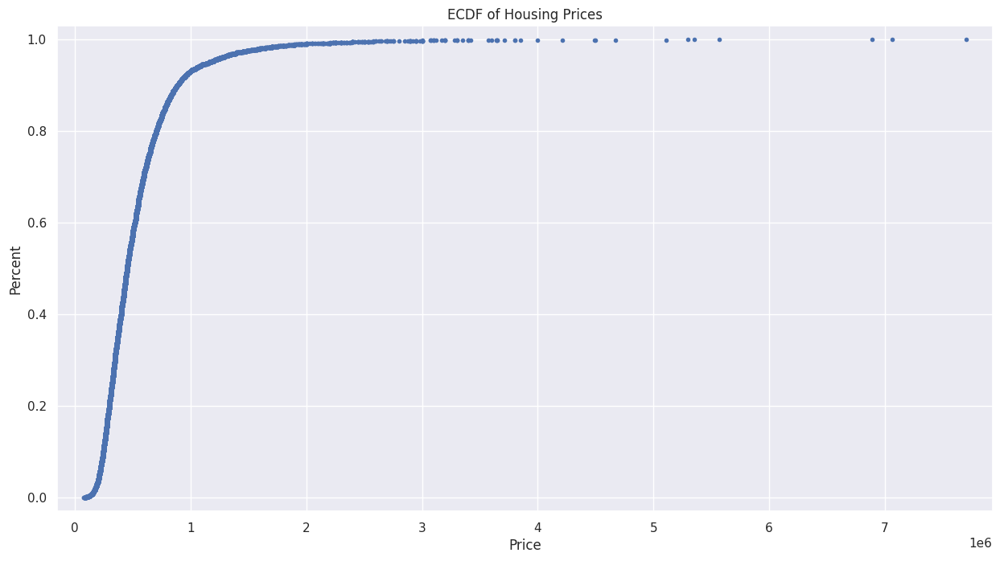

In [90]:
# Creating the xaxis and yaxis for our ecdf on the price of houses
x,y = ecdf(df['price'])

# Plotting our ecdf
plt.figure(figsize=(15,8), dpi=100)
plt.plot(x,y,linestyle='none',marker='.')
plt.title('ECDF of Housing Prices')
plt.xlabel('Price')
plt.ylabel('Percent')
plt.margins(0.03);

# Bivariate Analysis

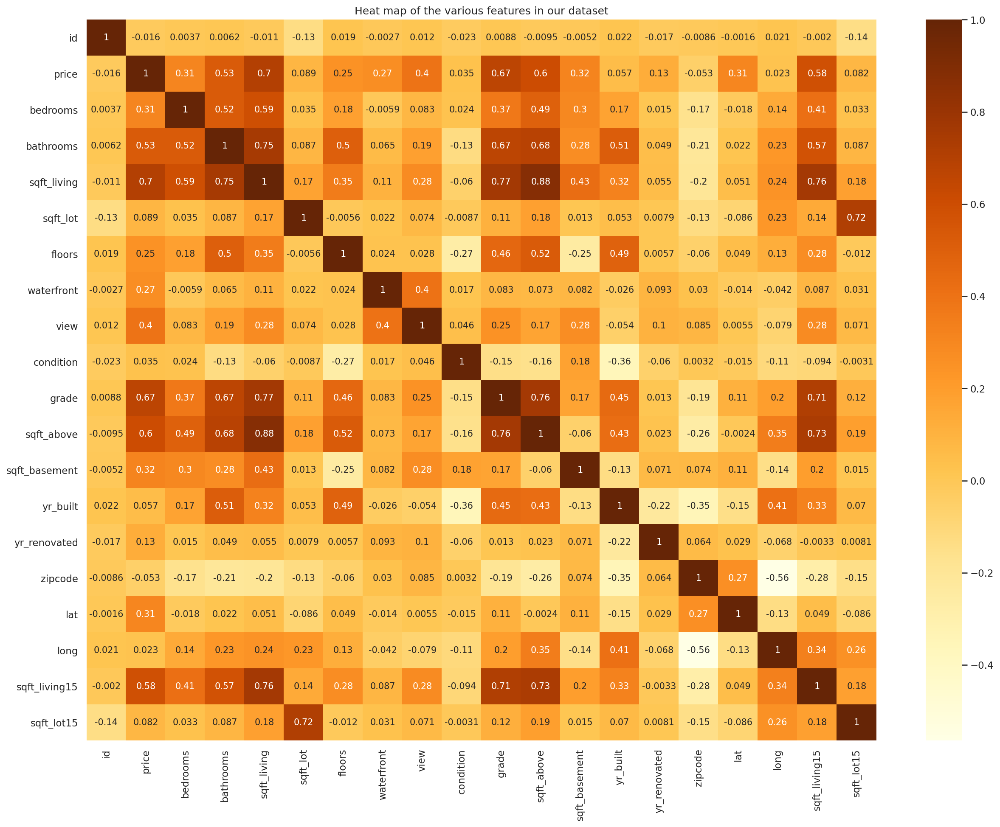

In [91]:
#Visualizing the correlation between the various features in our dataset
plt.figure(figsize=(20,15),dpi=150)
sns.heatmap(df.corr(), annot=True, cmap='YlOrBr')
plt.title('Heat map of the various features in our dataset');

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:1969: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


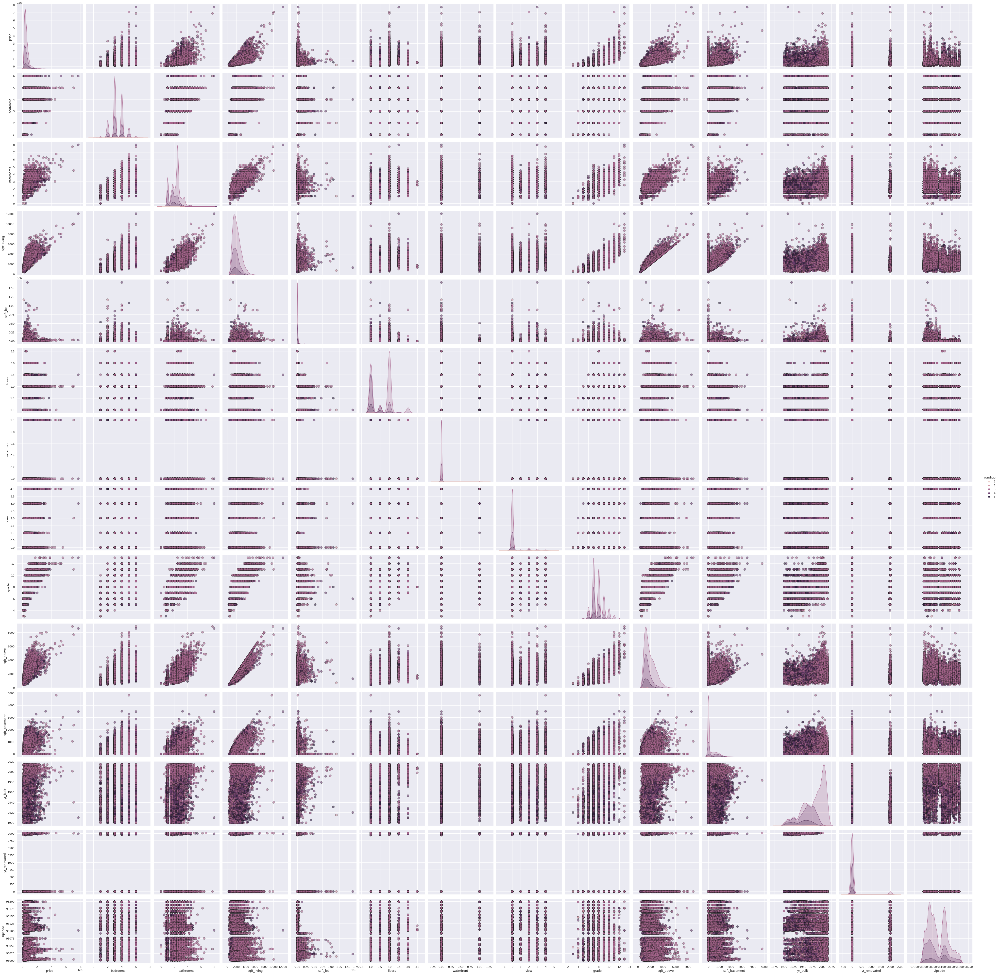

In [168]:
#Crossplots of features in our dataset
#to help us compare our variables side by side to draw relationships
sns.pairplot(data=df, hue='condition', diag_kind='kde',plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size= 4 );

In [93]:
df.head(1)

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,geodata
0,7129300520,221900.0,3,1.0,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,POINT (-122.257 47.5112)


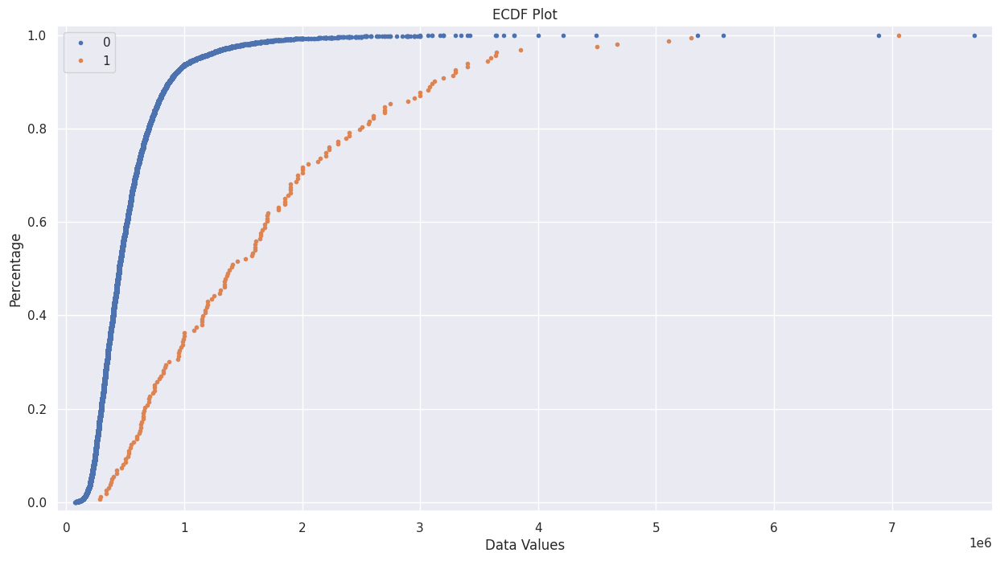

In [94]:
#ECDF of Price Vs Waterfront
waterfront= df.waterfront.unique()
plt.figure(figsize=(15,8), dpi=100)
plot_ecdf(df['price'][df.waterfront==0])
plot_ecdf(df['price'][df.waterfront==1])
plt.legend(labels=waterfront[::]);

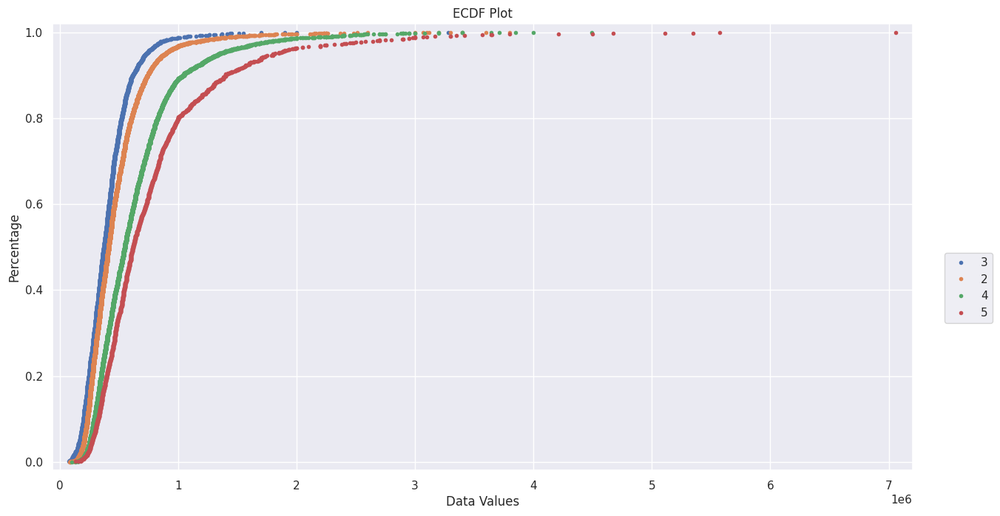

In [95]:
#Ecdf of 2,3,4 and 5 Bedrooms and Price
bedrooms= df.bedrooms.unique()
plt.figure(figsize=(15,8), dpi=100)
plot_ecdf(df['price'][df.bedrooms==2])
plot_ecdf(df['price'][df.bedrooms==3])
plot_ecdf(df['price'][df.bedrooms==4])
plot_ecdf(df['price'][df.bedrooms==5])
plt.legend(bbox_to_anchor= (1.1, 0.5), labels=bedrooms[::]);

In [96]:
df.head(1)

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,geodata
0,7129300520,221900.0,3,1.0,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,POINT (-122.257 47.5112)


In [97]:
#sns.boxenplot(data=df, x='price', y='sqft_living15')

Text(0.5, 1.0, 'Trend Analysis of House of Price Vs Year Built')

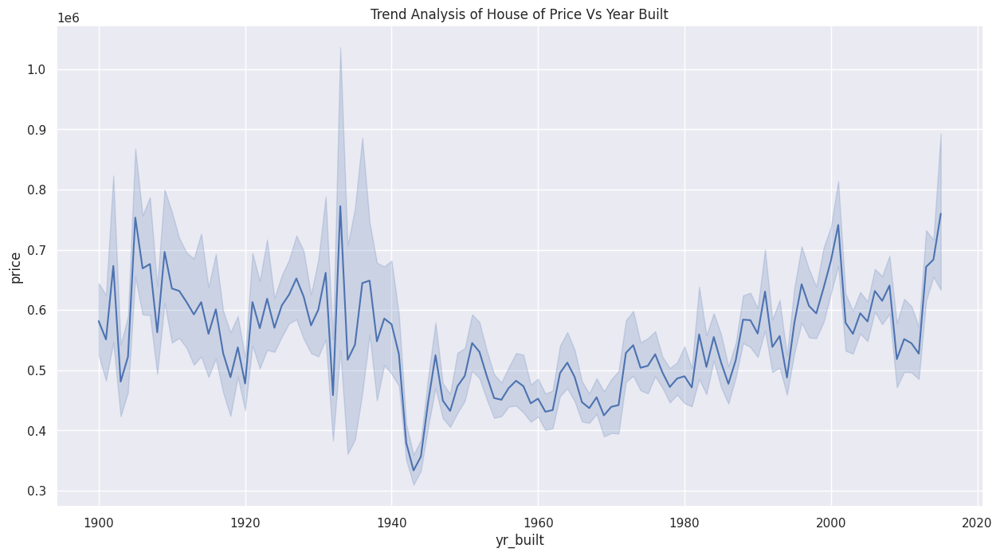

In [98]:
#Line Plot of house prices compare to the year a house was built
plt.figure(figsize=(15,8), dpi=100)
sns.lineplot(data=df, x='yr_built', y='price')
plt.title('Trend Analysis of House of Price Vs Year Built')

# Multivariate Analysis

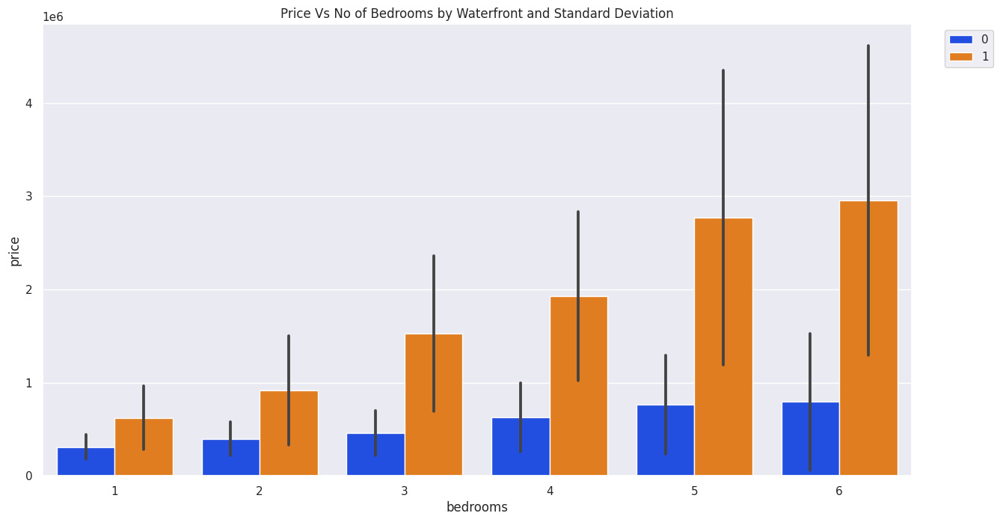

In [99]:
#Standard Deviation of Price considering the number of bedrooms and whether the
#house has a waterfront or not
plt.figure(figsize=(15,8), dpi=100)
sns.barplot(data=df, x='bedrooms',y='price', estimator=np.mean, ci='sd', hue='waterfront', palette='bright')
plt.legend(bbox_to_anchor= (1.1, 1))
plt.title('Price Vs No of Bedrooms by Waterfront and Standard Deviation');


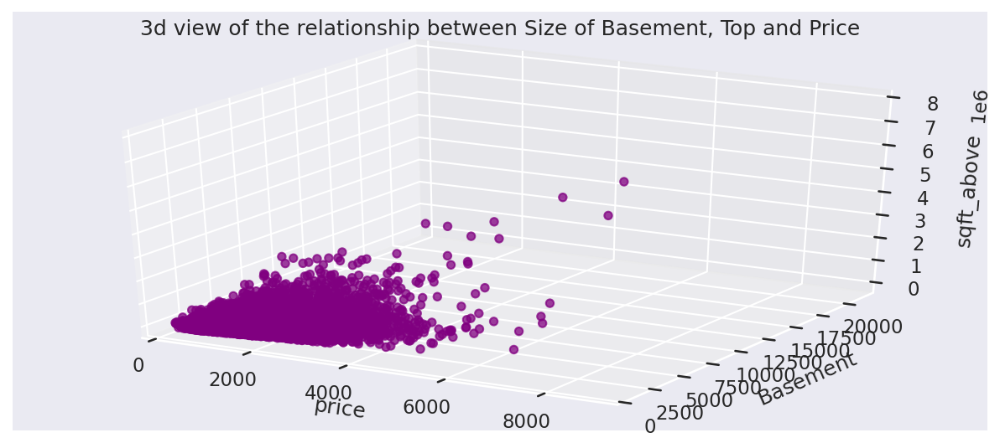

In [100]:
#3-D plot of Basement size, top size vs Price
fig=plt.figure(figsize=(22, 15), dpi=150)
ax=fig.add_subplot(3,2,1, projection="3d")
ax.scatter(df['sqft_above'],df['sqft_basement'],df['price'],c="purple",alpha=.75)
ax.set(xlabel='price',ylabel='Basement',zlabel='sqft_above')
ax.set(ylim=[0,22000])
plt.title('3d view of the relationship between Size of Basement, Top and Price');

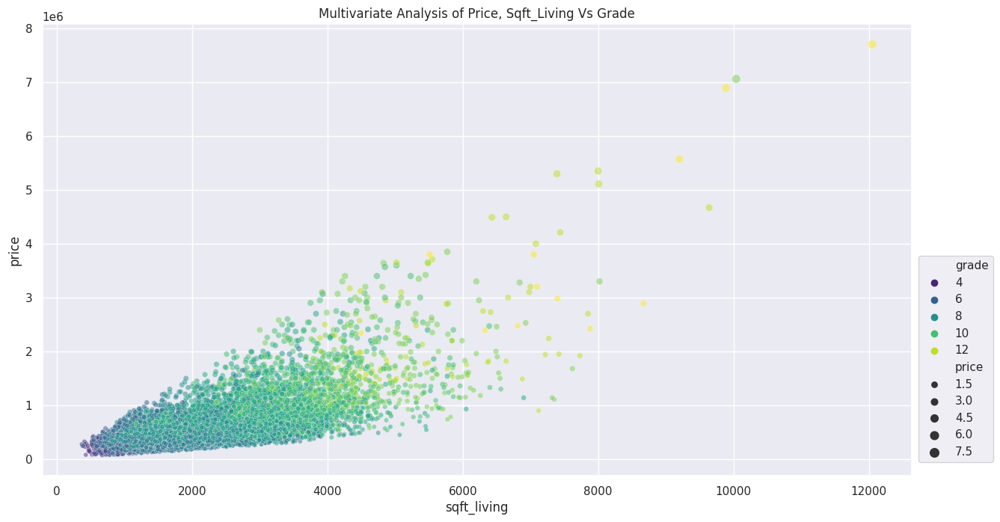

In [101]:
#Plot of the relationship between size of house and its prices vs grade
plt.figure(figsize=(15, 8), dpi=100)
sns.scatterplot(data=df, x='sqft_living', y='price', size='price', hue='grade',alpha=0.5, palette='viridis')
plt.title('Multivariate Analysis of Price, Sqft_Living Vs Grade')
plt.legend(bbox_to_anchor=(1.1, 0.5));

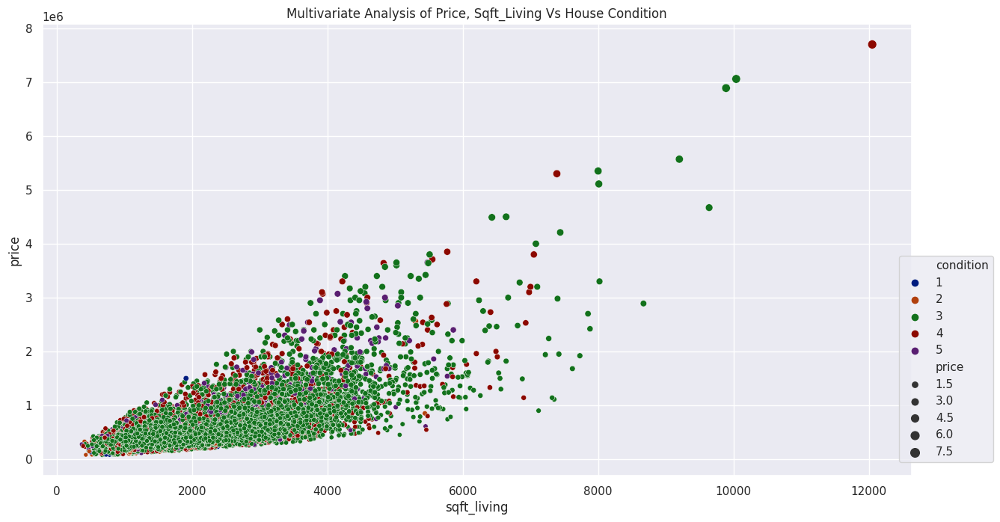

In [102]:
#Plot of the relationship between size of house and its prices vs condition
plt.figure(figsize=(15, 8), dpi=100)
sns.scatterplot(data=df, x='sqft_living', y='price', size='price', hue='condition',  palette='dark')
plt.title('Multivariate Analysis of Price, Sqft_Living Vs House Condition')
plt.legend(bbox_to_anchor=(1.1, 0.5));

Text(0.5, 1.0, 'Trend Analysis of House of Price Vs Year Built')

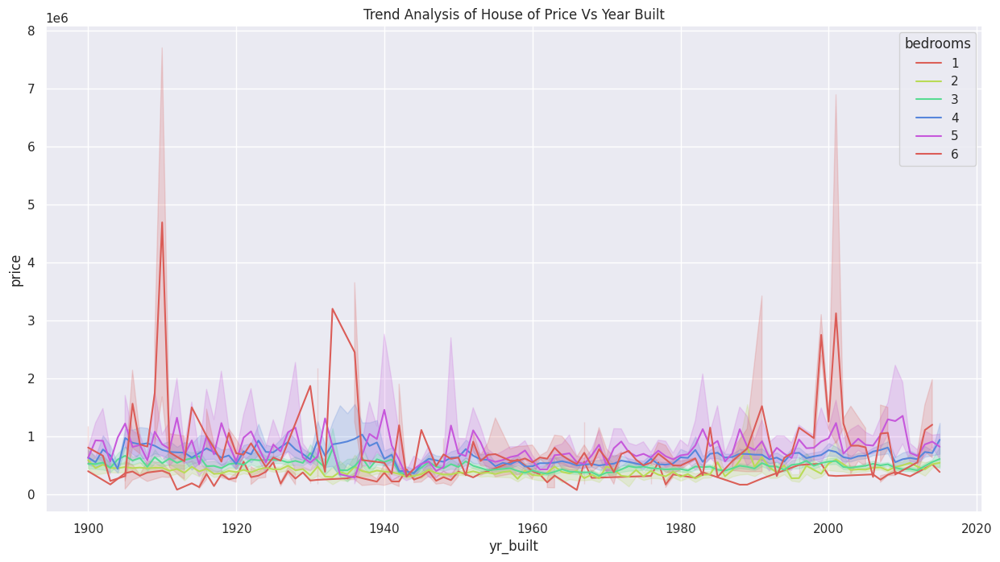

In [103]:
#Line Plot of house prices compare to the year a house was built by the number of
#bedrooms
plt.figure(figsize=(15,8), dpi=100)
sns.lineplot(data=df, x='yr_built', y='price', hue='bedrooms', palette='hls')
plt.title('Trend Analysis of House of Price Vs Year Built')

# **7. Implementing the Solution**

# Multicollinearity Check

In [104]:
#Before implementing Our Solution, we have to ensure that our dataset is fit for
#use i.e., it follows the assumptions under the Classical Linear Regression Model
#The assumptions of the classical linear regression model include:
#Linearity
#No endogeneity
#Normality & Homoscedasticity
#No autocorrelation
#No Multicollinearity

#Multicollinearity is observed when two or more explanatory variables
#are very highly correlated

#The problem with ignoring multicollinearity if present is that
# 1. our R2 will be high but the individual coefficents will
#have high standard errors
#2. THe regression becomes very sensitive to small changes 
#in the specification
#As such confidence intervals for the parameters will be very
#wide, and significance tests might yield inappropriate conclusions
#3. Our model may be trained inefficiently

In [105]:
df.head(1)

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,geodata
0,7129300520,221900.0,3,1.0,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,POINT (-122.257 47.5112)


In [106]:
#As mentioned in the feature engineering section, we will drop the following columns
#as they are not useful in answering the question under study.
#sqft of 15 neighbours's living and parking lot will not play
#a huge role in the sale of a house. 
#From the pair plot, we saw geolocation has a slight relationship with price, however,
#since we have zipcode in our dataset, we proceed to drop longitudes and latitudes
df.drop(['id', 'sqft_living15', 'sqft_lot15', 'lat', 'long', 'geodata'], axis=1, inplace=True)

In [107]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074


In [108]:
#We check for multicollinearity by using 
#Correlation and the Variance Inflection Factor (VIF)
#VIF is a measure of how much variance of a regression coefficient in a model
#increases if the explanatory variables are correlated.
#A VIF of one means there is no correlation
#If the VIF is between 5 & 10, then there is a big problem and solutions
#for the high correlation have to be explored.

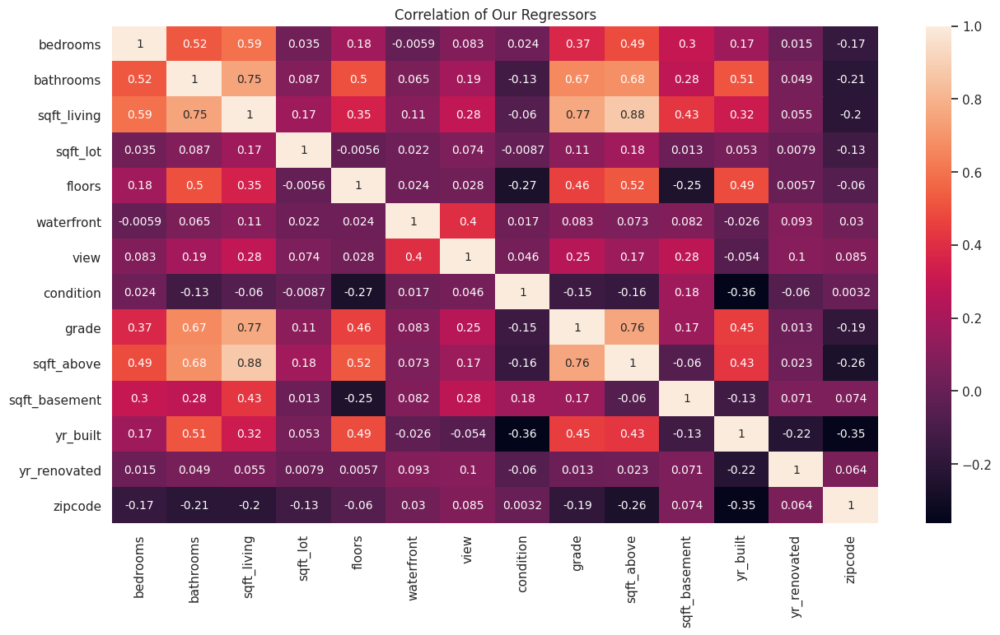

In [109]:
regressors= df.drop('price', axis=1)
plt.figure(figsize=(15,8), dpi=100)
sns.heatmap(regressors.corr(), annot=True)
plt.title('Correlation of Our Regressors');

In [110]:
#Deriving the Correlations Overview

regressors= regressors.corr()

In [111]:
#Computing the Variance Inflection Factor

pd.DataFrame(np.linalg.inv(regressors.values), index = regressors.index, columns=regressors.columns)

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode
bedrooms,1.689672,-0.445053,-1.009252e-01,0.110983,0.044958,0.067710,0.112066,-0.056939,0.332345,-8.233084e-01,-4.617688e-01,0.109092,0.044895,0.087758
bathrooms,-0.445053,3.358629,-2.284688e+00,0.032087,-0.716510,0.008032,-0.032108,-0.143822,-0.279084,8.825720e-01,3.222444e-02,-0.919327,-0.259497,0.002596
sqft_living,-0.101513,-2.286884,-3.682106e+13,-0.210835,-0.082301,-0.474233,0.964517,-0.819886,-1.004550,3.332046e+13,1.780588e+13,1.099304,0.014100,-0.245662
sqft_lot,0.110983,0.032087,-2.114173e-01,1.068237,0.120351,0.016908,-0.056651,0.004987,0.074453,-1.654556e-01,4.792870e-02,-0.007036,-0.004591,0.096819
floors,0.044958,-0.716510,-8.473167e-02,0.120351,1.960844,-0.013409,-0.002181,0.090745,-0.214633,-1.895206e-01,6.964792e-01,-0.402874,-0.079649,-0.301504
waterfront,0.067710,0.008032,-4.739298e-01,0.016908,-0.013409,1.203683,-0.489883,-0.015216,0.068257,3.443134e-01,2.283205e-01,-0.017278,-0.067231,0.008116
view,0.112066,-0.032108,9.627279e-01,-0.056651,-0.002181,-0.489883,1.389041,-0.019297,-0.257545,-1.003786e+00,-7.669890e-01,0.144672,-0.031961,-0.106242
condition,-0.056939,-0.143822,-8.201851e-01,0.004987,0.090745,-0.015216,-0.019297,1.244881,-0.003078,8.281146e-01,3.153087e-01,0.545355,0.201465,0.169249
grade,0.332345,-0.279084,-9.982752e-01,0.074453,-0.214633,0.068257,-0.257545,-0.003078,3.015706,-1.079726e+00,-2.017283e-01,-0.443547,-0.013730,-0.050539
sqft_above,-0.821603,0.887486,3.332046e+13,-0.166158,-0.192768,0.344460,-1.004962,0.827853,-1.074551,-3.015265e+13,-1.611306e+13,-0.618406,0.009769,0.500595


In [112]:
#The VIF for our regressors are the diagonal values from left to right. 
#Our VIFs are about between negative and 3.3 values with most of the values being either one or close to one. We therefore conclude our variables are not highly correlated.

# The Model

# **a.) Multiple Linear Regression**

In [113]:
#Checking our dataset
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074


In [114]:
#Define our regressors (X) and regressand(y)

#Our regressors
X= df.drop('price', axis=1)

#Our regressand
y=df['price']

In [115]:
#Checking values in our regressor
X.values

array([[3.0000e+00, 1.0000e+00, 1.1800e+03, ..., 1.9550e+03, 0.0000e+00,
        9.8178e+04],
       [3.0000e+00, 2.2500e+00, 2.5700e+03, ..., 1.9510e+03, 1.9910e+03,
        9.8125e+04],
       [2.0000e+00, 1.0000e+00, 7.7000e+02, ..., 1.9330e+03, 0.0000e+00,
        9.8028e+04],
       ...,
       [2.0000e+00, 7.5000e-01, 1.0200e+03, ..., 2.0090e+03, 0.0000e+00,
        9.8144e+04],
       [3.0000e+00, 2.5000e+00, 1.6000e+03, ..., 2.0040e+03, 0.0000e+00,
        9.8027e+04],
       [2.0000e+00, 7.5000e-01, 1.0200e+03, ..., 2.0080e+03, 0.0000e+00,
        9.8144e+04]])

In [116]:
#Shape of our regressor
X.shape

(21535, 14)

In [117]:
#Shape of our regressand
y.shape

(21535,)

# **Performing Multilinear Regression**

In [118]:

#Performing a Linear Regression and then compare it with quantile regression, lasso
#ridge and elasticnet

#Importing the train_test_split library
from sklearn.model_selection import train_test_split

#Specifying our train and test variable
#Given the size of our dataset, a test size of 0.3 is appropriate
#We retain the default 42 random_state to reshuffle out data to prohibited sorted values
# from being trained leading to erroneous results
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [119]:
#Checking length of our X_test
#We expect to see 30% of the data as its length
len(X_test)

6461

In [120]:
#Checking length of X_train
#Should have 70% of the data
len(X_train)

15074

In [121]:
#To carry out the regression, we leverage SKLearn and import Linear Regression
from sklearn.linear_model import LinearRegression

In [122]:
#Instantiate the model
ln_model = LinearRegression()

In [123]:

#Training Our Model
#We expose our model(X_train and y_train) to 70% of the data
ln_model.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [124]:
X_train

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode
993,3,2.00,1490,7651,1.0,0,0,3,7,1490,0,1988,0,98003
2452,5,3.00,3655,51836,1.0,0,0,5,8,2174,1481,1955,0,98008
1892,3,1.00,2150,7007,1.0,0,0,3,6,2150,0,1954,0,98177
13679,3,1.75,1660,12865,1.0,0,0,5,7,1660,0,1967,0,98056
11638,3,1.75,1510,3600,1.0,0,0,5,8,1230,280,1910,0,98119
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11324,2,2.50,1860,6359,2.0,0,0,3,7,1860,0,2003,0,98038
12004,3,1.75,1600,2538,2.0,0,0,3,7,1600,0,1929,0,98102
5408,3,2.00,1970,9600,1.0,0,0,4,7,1300,670,1967,0,98003
861,3,1.00,910,5212,1.0,0,0,3,7,910,0,1951,0,98115


In [125]:
#Testing our model
#Having trained our model, we pass our untrained data- the 30% into the trained
#model and draw predictions of what our new regressands with different 
#feature combinations.
y_pred = ln_model.predict(X_test)

# **Model Evaluation**

In [126]:
#Performance Evaluation 
#To evaluate the performance of our model, we shall look
#at the following:
#Mean Absolute Error
#Mean Squared Error
#Root Mean Square Error

#The Mean Absolute Error is basically the difference between our predicted
#regressand and the mean value of our initial regressand.

#The Mean Squared Error on the other hand is the squared difference between the
#predicted regressand and the initial regressand. It is squared to remove the 
#cancellation effect of adding points above and below the regression line.

#The Root Mean Square Error on the other hand is the square root of the Mean Squared
#Error and a better measure of the variance as the Mean Square Error punishes
#Any deviations heavily.

In [127]:
#We leverage SKLearn to get the Mean Absolute Error and Mean Squared Error to
#evaluate the performance of our model.
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [128]:
#Deriving the average price from our house dataset
df.price.mean()

539049.4117483167

In [129]:
#Computing our Mean absolute error and storing it as Mea_ln

mea_ln = mean_absolute_error(y_test, y_pred)
mea_ln

140718.90477992827

In [130]:
#Computing Our RMSE
rmse_ln = np.sqrt(mean_squared_error(y_test, y_pred))
rmse_ln

222792.3949890893

In [131]:
#Computing Our R2 Score
ln_r2score =r2_score(y_test, y_pred)

ln_r2score

0.6337795663683088

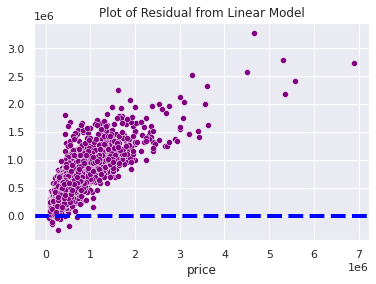

In [166]:
#Plotting Residuals to determine viability of our model
#A residual plot is helpful in determining whether the error
#follows the assumptions of a classical linear regression model, 
#in prticular, that the there is no variance between the errors


#Let's derive the residuals
test_residual = y_test-y_pred

#Plotting 
sns.scatterplot(x=y_test, y=y_pred, color='purple')
plt.axhline(y=test_residual.mean(), color='blue', ls='--', lw=4)
plt.title('Plot of Residual from Linear Model');

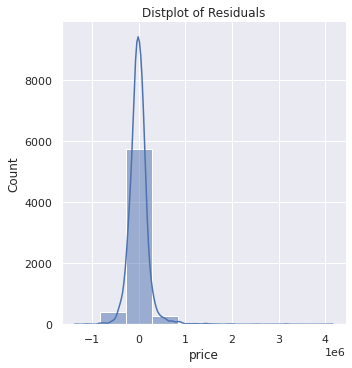

In [133]:
#Visualizing Our Residual Using a Distplot
sns.displot(test_residual, bins=10, kde=True)
plt.title('Distplot of Residuals');

In [134]:

#Applying the Bartlett's test to check whether our residuals are homoscedasticity.
#We are testing the null hypothesis that there is a constant variance in the data
# and that there are no specific patterns.

In [135]:

#Importing Relevant Libraries from SCIPY
import scipy as sp

test_result, p_value = sp.stats.bartlett(y_pred, test_residual)

# To help us interpret the results we must also compute 
#a critical value of the chi squared distribution
degree_of_freedom = len(y_pred)-1
probability = 1 - p_value

critical_value = sp.stats.chi2.ppf(probability, degree_of_freedom)
print(p_value)

# If the test_result is greater than the critical value, then we reject our null
# hypothesis. This would mean that there are patterns to the variance of the data

# Otherwise, we can identify no patterns, and we accept the null hypothesis that 
# the variance is homogeneous across our data

if (test_result > critical_value):
  print('the variances are unequal, and the model should be reassessed')
else:
  print('the variances are homogeneous!')

2.8387370353368803e-107
the variances are homogeneous!


# **b.) Quantile Regression**

**Intuition**

Quantile Regression is a powerful machine technique that is frequently used to make predictions on what bounds the regressands of tested data may belong to. Applying this idea to our current problem, quantile regression will help determine the bounds our predited housing prices may take . 

Quantile Regression models for Conditional Quantiles of the regressors. Whilst the Ordinary Least Squares Approach models for the conditional mean- which is a single values, QR allows for the investigation of various considerations of the regressors and their impact on the regressand. For instance, To what extend would a house with condtion 5 or grade 13 influence price of the house. How does grade 2 and condition 2 compare? As such, QR is a better model when we would like to explore other factors beyond the mean. 

Linear regression may not be a suitable model because it assumes a single interpretation for marginal effect. i.e. at different data bounds, it draws the same conclusion. 

**Advantages**
We have some outliers in our housing dataset and given that QR leverages the median approach, it would be more robust to those outliers. Furthermore, it deals better with data that doesn't quite abide by the assumptions and the Classical Linear Regression Model i.e normality and homoscedasticity.

That is why we adopt it here. 



In [167]:
# We will use the python package statsmodels for Quantile Regression
#
import statsmodels.formula.api as smf

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# **c.) Least Absolute Shrinkage & Slection Operator (LASSO) Regression**

In [136]:
 from sklearn.linear_model import Lasso, LassoCV
 

In [137]:
#Implemeting Lasso Regression

#Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [138]:
#Instantiating Lasso
lasso = Lasso(alpha=0.1, normalize=True, max_iter=1000000)

In [139]:
lasso.fit(X_train, y_train)

Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=1000000,
      normalize=True, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [140]:
lasso_pred=lasso.predict(X_test)

In [141]:
lasso.score(X_test, y_test)

0.633784726128569

In [142]:
lasso.coef_

array([-4.64026326e+04,  4.74990428e+04,  1.68143713e+02, -2.70987849e-01,
        2.66382005e+04,  6.11624330e+05,  4.38537716e+04,  1.78656024e+04,
        1.25208089e+05,  0.00000000e+00,  1.12778150e+01, -3.58620226e+03,
        1.03977372e+01, -4.39271526e+01])

In [143]:
#Splitting Our Data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [144]:
#Instantiating the LassoCV Model
lasso_cv = LassoCV(eps=0.001, n_alphas=100, cv=5, max_iter=10000)

In [145]:
#Fitting Our Model
lasso_cv.fit(X_train, y_train)

LassoCV(alphas=None, copy_X=True, cv=5, eps=0.001, fit_intercept=True,
        max_iter=10000, n_alphas=100, n_jobs=None, normalize=False,
        positive=False, precompute='auto', random_state=None,
        selection='cyclic', tol=0.0001, verbose=False)

In [146]:
lasso_cv.alpha_

1421248.118004661

In [147]:
lasso_cv.coef_

array([  -0.        ,    0.        ,  279.25781449,   -0.28347295,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,   -0.        ,   10.00892096, -213.46918765,
         65.63757994,    0.        ])

# **d.) Ridge Regression**

In [148]:
#Specifying our regressors and regressands
df.head()

#Regressors
X= df.drop('price', axis=1)

#Regressand
y=df['price']

In [149]:
#We leverage SKLearn Library to split our data into training and test

from sklearn.model_selection import train_test_split

#Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [150]:
#We need to standardize our data to enable comparability
#To do this we leverage SK Learn 

from sklearn.preprocessing import StandardScaler

#Instantiaitng Our Scaler

scaler = StandardScaler()

#Fitting X_train to the scaler

scaler.fit(X_train)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [151]:
#Transforming Our Data
X_train = scaler.transform(X_train)

X_test = scaler.transform(X_test)

In [152]:
#Checking values in X_train
X_train[0]

array([-0.41276515, -0.15551826, -0.64863118, -0.18286276, -0.92456687,
       -0.08415328, -0.30450631, -0.62547689, -0.56993349, -0.36772219,
       -0.65888021,  0.56728466, -0.20518027, -1.40498048])

In [153]:
#Importing Ridge

from sklearn.linear_model import Ridge, RidgeCV
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import SCORERS

In [154]:
ridge = Ridge(normalize=True)
search = GridSearchCV(estimator=ridge,param_grid={'alpha':np.logspace(-5,2,8)},scoring='neg_mean_squared_error',n_jobs=1,refit=True,cv=10)

In [155]:
search.fit(X,y)
search.best_params_
{'alpha': 0.01}
abs(search.best_score_) 

46764112266.54517

In [156]:
ridge = Ridge(normalize=True,alpha=0.01)
ridge.fit(X,y)

Ridge(alpha=0.01, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=True, random_state=None, solver='auto', tol=0.001)

In [157]:
ridge_cv = RidgeCV(alphas=(0.1, 1.0, 10.0), cv=5, scoring='neg_mean_absolute_error')

In [158]:
ridge_cv.fit(X_train, y_train)

RidgeCV(alphas=array([ 0.1,  1. , 10. ]), cv=5, fit_intercept=True,
        gcv_mode=None, normalize=False, scoring='neg_mean_absolute_error',
        store_cv_values=False)

In [159]:
ridge_cv.alpha_

10.0

In [160]:
y_pred = ridge_cv.predict(X_test)

In [161]:
mea_ridgecv= mean_absolute_error(y_test, y_pred)

In [162]:
rmse_ridgecv = np.sqrt(mean_squared_error(y_test, y_pred))

In [163]:
mea_ridgecv

140695.83633841755

In [164]:
rmse_ridgecv

222789.08525874125